# Hospitality in Era of Airbnb
###### Ziqun Li    
###### MUSA-620 Final Project Code

## Part 1. Explorary Analysis of New York Airbnb 

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

### 1.1  Data Collection

In [2]:
# load the airbnb data
pd.set_option('display.max_columns', None)
airbnb_ori=pd.read_csv("./data/listings_detail.csv",low_memory=False)
airbnb_ori.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3647,https://www.airbnb.com/rooms/3647,20190912153101,2019-09-13,THE VILLAGE OF HARLEM....NEW YORK !,NaN,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,none,NaN,NaN,NaN,NaN,NaN,Upon arrival please have a legibile copy of yo...,NaN,NaN,https://a0.muscache.com/im/pictures/838341/9b3...,NaN,4632,https://www.airbnb.com/users/show/4632,Elisabeth,2008-11-25,"New York, New York, United States",Make Up Artist National/ (Website hidden by Ai...,a few days or more,0%,NaN,f,https://a0.muscache.com/im/users/4632/profile_...,https://a0.muscache.com/im/users/4632/profile_...,Harlem,1.0,1.0,"['email', 'phone', 'google', 'reviews', 'jumio...",t,t,"New York, NY, United States",Harlem,Harlem,Manhattan,New York,NY,10027,New York,"New York, NY",US,United States,40.80902,-73.94190,t,Apartment,Private room,2,1.0,1.0,1.0,Pull-out Sofa,"{""Cable TV"",Internet,Wifi,""Air conditioning"",K...",NaN,$150.00,NaN,NaN,$200.00,$75.00,2,$20.00,3,7,3,3,7,7,3.0,7.0,37 months ago,t,30,60,90,365,2019-09-13,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,NaN,f,f,strict_14_with_grace_period,t,t,1,0,1,0,NaN
1,3831,https://www.airbnb.com/rooms/3831,20190912153101,2019-09-13,Cozy Entire Floor of Brownstone,Urban retreat: enjoy 500 s.f. floor in 1899 br...,Greetings! We own a double-duplex brownst...,Urban retreat: enjoy 500 s.f. floor in 1899 br...,none,Just the right mix of urban center and local n...,NaN,B52 bus for a 10-minute ride to downtown Brook...,You will have exclusive use of and access to: ...,"We'll be around, but since you have the top fl...",Smoking - outside please; pets allowed but ple...,NaN,NaN,https://a0.muscache.com/im/pictures/e49999c2-9...,NaN,4869,https://www.airbnb.com/users/show/4869,LisaRoxanne,2008-12-07,"New York, New York, United States",Laid-back bi-coastal actor/professor/attorney.,within an hour,92%,NaN,f,https://a0.muscache.com/im/users/4869/profile_...,https://a0.muscache.com/im/users/4869/profile_...,Clinton Hill,1.0,1.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Brooklyn, NY, United States",Brooklyn,Clinton Hill,Brooklyn,Brooklyn,NY,11238,New York,"Brooklyn, NY",US,United States,40.68514,-73.95976,t,Guest suite,Entire home/apt,3,1.0,1.0,4.0,Real Bed,"{TV,""Cable TV"",Internet,W

In [3]:
# load the neighbourhood data
import json
import requests

url = 'http://data.insideairbnb.com/united-states/ny/new-york-city/2019-09-12/visualisations/neighbourhoods.geojson'
neighbor = gpd.read_file(url).to_crs(epsg=3857)
neighbor.head()

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,(POLYGON ((-8211672.372056099 4955705.98588607...
1,Allerton,Bronx,(POLYGON ((-8220788.21383767 4993431.405621486...
2,City Island,Bronx,(POLYGON ((-8213466.174330741 4989346.93912581...
3,Ditmars Steinway,Queens,(POLYGON ((-8226688.814766658 4978147.90171474...
4,Ozone Park,Queens,(POLYGON ((-8219557.799505931 4966923.95857947...


### 1.2  Data Cleaning

In [4]:
# filter the airbnb data
columns=['id',
 'name',
 'description',
 'host_id',
 'host_since',
 'host_response_rate',
 'host_identity_verified',
 'host_response_time',
 'instant_bookable',
 'neighbourhood_group_cleansed',
 'neighbourhood_cleansed',
 'latitude',
 'longitude',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'price',
 'guests_included',
 'minimum_nights',
 'availability_30',
 'number_of_reviews',
 'review_scores_rating',
 'last_review',
 'reviews_per_month',
 'cancellation_policy']

airbnb=pd.DataFrame(airbnb_ori, columns=columns)
airbnb=airbnb.rename(columns={"neighbourhood_group_cleansed":"neighbourhood_group","neighbourhood_cleansed":"neighbourhood"})

# extract the year from host_since
airbnb['host_year'] = pd.DatetimeIndex(airbnb['host_since']).year
# extract the price from price
airbnb['price'] = airbnb['price'].str.extract('(\d+)', expand=False)
airbnb['price'] = airbnb['price'].astype(int)
# extract the host response rate from host_response_rate
airbnb['host_response_rate']= airbnb['host_response_rate'].str.extract('(\d+)', expand=False)
airbnb['host_response_rate'] = airbnb['host_response_rate'].astype(float)
# calculate price per person 
airbnb['price_per_person']=airbnb["price"]/airbnb["accommodates"]
# add the count field
airbnb["count"]=1

# delete the outlier
airbnb=airbnb.dropna(subset=["latitude","longitude","price","accommodates","reviews_per_month","host_year"])
airbnb=airbnb[(airbnb["reviews_per_month"]<30)&(airbnb["reviews_per_month"]>=0)]

# convert the data type
airbnb['reviews_per_month'] = airbnb['reviews_per_month'].astype(float)
airbnb['accommodates'] = airbnb['accommodates'].astype(int)
airbnb['host_year'] = airbnb['host_year'].astype(int)

airbnb.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count
1,3831,Cozy Entire Floor of Brownstone,Urban retreat: enjoy 500 s.f. floor in 1899 br...,4869,2008-12-07,92.0,t,within an hour,f,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,3,1.0,1.0,4.0,89,1,1,1,279,90.0,2019-08-29,4.62,moderate,2008,29.666667,1
2,5022,Entire Apt: Spacious Studio/Loft by central park,Loft apartment with high ceiling and wood floo...,7192,2009-01-29,NaN,t,NaN,f,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,1,1.0,NaN,1.0,80,1,10,0,9,93.0,2018-11-19,0.10,strict_14_with_grace_period,2009,80.000000,1
3,5099,Large Cozy 1 BR Apartment In Midtown East,My large 1 bedroom apartment has a true New Yo...,7322,2009-02-02,78.0,f,within a day,f,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,2,1.0,1.0,1.0,200,2,3,3,75,89.0,2019-07-21,0.59,moderate,2009,100.000000,1
4,5121,BlissArtsSpace!,HELLO EVERYONE AND THANKS FOR VISITING BLISS A...,7356,2009-02-03,0.0,f,a few days or more,f,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,2,NaN,1.0,1.0,60,1,45,0,49,90.0,2017-10-05,0.39,strict_14_with_grace_period,2009,30.000000,1
5,5178,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,8967,2009-03-03,90.0,f,within a few hours,f,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,2,1.0,1.0,1.0,79,1,2,1,443,83.0,2019-08-27,3.51,strict_14_with_grace_period,2009,39.500000,1


### 1.3 Spatial  distribution of New York Airbnb  (visualize by folium)

In [5]:
# define basemap in folium
import folium
from folium.plugins import HeatMap

def generateBaseMap_black(default_location=[40.693943, -73.985880], default_zoom_start=10):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start,tiles='Stamen TonerLite',attr="default")
    return base_map
#cartodbpositron

In [6]:
# plot the locations of Airbnb
base_map=generateBaseMap_black()

air_point = folium.map.FeatureGroup()
for lat, lng, in zip(airbnb.latitude, airbnb.longitude):
    air_point.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=1, # define how big the circle markers to be
            color="none",
            fill=True,
            fill_color='#339999',
            fill_opacity=0.4
        )
    )
    
folium_overview=base_map.add_child(air_point)
folium_overview.save("./diagram/folium_overview.html")

In [7]:
# calculate the airbnb count by neighborhood
count_neighbor=airbnb.groupby(["neighbourhood_group","neighbourhood"])["count"].sum()
count_neighbor=pd.DataFrame(count_neighbor).reset_index()
count_neighbor.head()

,neighbourhood_group,neighbourhood,count
0,Bronx,Allerton,42
1,Bronx,Baychester,7
2,Bronx,Belmont,21
3,Bronx,Bronxdale,16
4,Bronx,Castle Hill,2


In [8]:
# visualize the airbnb count by neighbourhood
base_map=generateBaseMap_black()

nei_geo=f'{url}'
folium.Choropleth(
    geo_data=nei_geo,
    data=count_neighbor,
    columns=['neighbourhood','count'],
    key_on='feature.properties.neighbourhood',
    fill_color='GnBu',
    fill_opacity=0.8,
    line_color="#339999",
    line_opacity=1,
    highlight=True,
    legend_name='Airbnb Count by neighbourhood'
).add_to(base_map)

base_map.save("./diagram/folium_countbyneighbor.html")

### 1.4 Exploratory analysis of New York airbnb dataset (visualize by seaborn)

In [9]:
import seaborn as sns

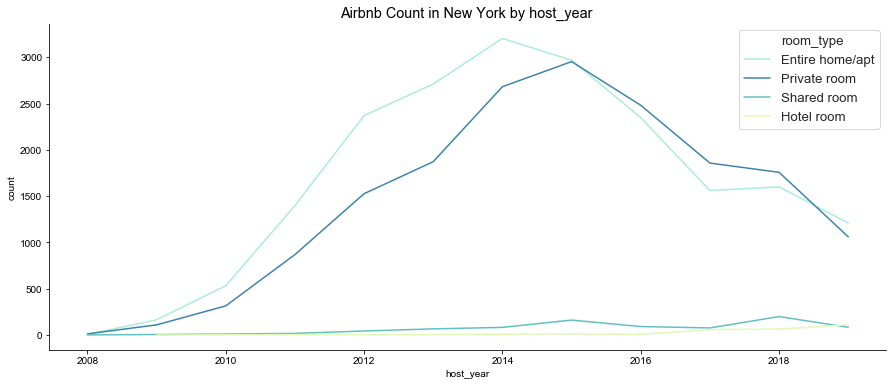

In [10]:
group_year=airbnb.groupby(["host_year","room_type"]).size()
groupyear=pd.DataFrame(group_year)
groupyear=groupyear.rename(columns={0:"count"})
groupyear=groupyear.reset_index()

# Initialize the figure and axes
fx,ax=plt.subplots(figsize=(15,6))

# Set the gtid style and font size
sns.set(style='whitegrid',font_scale=1.2)

# Set the color map
color_map = {"Entire home/apt": "#abedd8", "Private room": "#3d84a8", "Shared room":"#61c0bf", "Hotel room":"#e0f9b5"}
colors = [color_map[room_type] for room_type in airbnb["room_type"]]
style = dict(palette=color_map)

# Plot the line
ax = sns.lineplot(x='host_year',y='count',hue="room_type",markers=True,data=groupyear,**style)

# Add a legend and informative axis label
ax.legend(ncol=1, loc="upper right", frameon=True)
ax.set(ylabel="count",xlabel="host_year")
# Add a title
ax.set_title("Airbnb Count in New York by host_year ")
sns.despine(left=False, bottom=False)

figure = ax.get_figure() 
figure.savefig("./diagram/line_count.png",bbox_inches='tight')

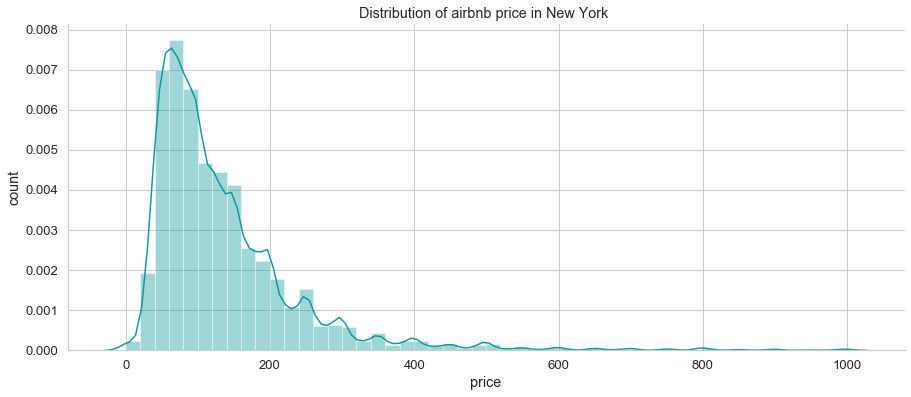

In [11]:
# Initialize the figure and axes
fx,ax=plt.subplots(figsize=(15,6))
# Set the gtid style and font size
sns.set(style='whitegrid',font_scale=1.2)
# Plot the histogram
sns.distplot(airbnb["price"],color="#11999E")
# Set the axis label
ax.set(ylabel="count",xlabel="price")
# Add a title
ax.set_title("Distribution of airbnb price in New York ")
sns.despine(left=False, bottom=False)

figure = ax.get_figure() 
figure.savefig("./diagram/hist.png",bbox_inches='tight')

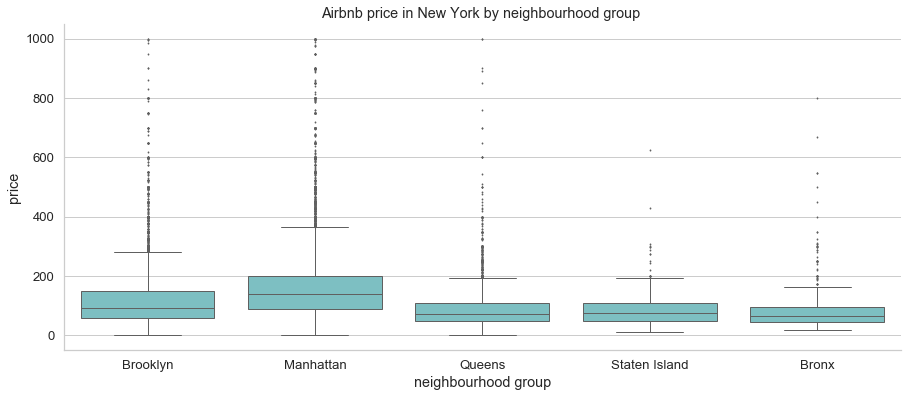

In [12]:
# Initialize the figure and axes
fx,ax=plt.subplots(figsize=(15,6))
# Set the gtid style and font size
sns.set(style='whitegrid',font_scale=1.2)

sns.boxplot(airbnb["neighbourhood_group"],airbnb["price"],data=airbnb,color="#71c9ce",fliersize=1,linewidth=1,ax=ax)

ax.set(ylabel="price",xlabel="neighbourhood group")
# Add a title
ax.set_title("Airbnb price in New York by neighbourhood group ")
sns.despine(left=False, bottom=False)

figure = ax.get_figure() 
figure.savefig("./diagram/box.png",bbox_inches='tight')

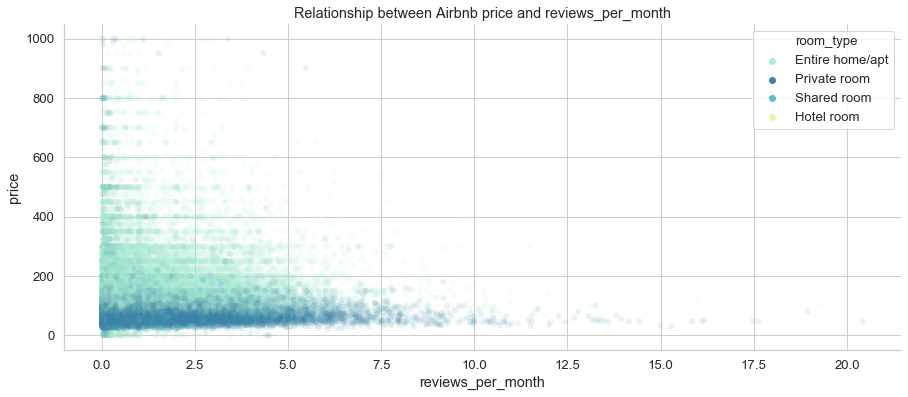

In [13]:
# Initialize the figure and axes
fx,ax=plt.subplots(figsize=(15,6))

# Set the gtid style and font size
sns.set(style='whitegrid',font_scale=1.2)

# Set the color map
color_map = {"Entire home/apt": "#abedd8", "Private room": "#3d84a8", "Shared room":"#61c0bf", "Hotel room":"#e0f9b5"}
colors = [color_map[room_type] for room_type in airbnb["room_type"]]
style = dict(palette=color_map,edgecolor="none", alpha=0.1)

# plot the point
sns.scatterplot(airbnb["reviews_per_month"], airbnb["price"], hue="room_type",data=airbnb, ax=ax,**style)

# Add a legend and informative axis label
ax.legend(ncol=1, loc="upper right", frameon=True)
ax.set(ylabel="price",xlabel="reviews_per_month")
# Add a title
ax.set_title("Relationship between Airbnb price and reviews_per_month")
sns.despine(left=False, bottom=False)

figure = ax.get_figure() 
figure.savefig("./diagram/scatter_price_reviews.png",bbox_inches='tight')

## Part 2 Find the Neighbourhood with Cost-Effective Airbnb for Guests in New York 

In this part, we clustered neiborhoods by Airbnb stats, trying to find the most cost-effective neighbourhood for the Airbnb guests.

In [14]:
# filter the clustering field
columns=[
 'neighbourhood_group',
 'neighbourhood',
 'price_per_person',
 'reviews_per_month',
 'review_scores_rating',
 'count']

airbnb_cluster=pd.DataFrame(airbnb,columns=columns)
airbnb_cluster.head()

,neighbourhood_group,neighbourhood,price_per_person,reviews_per_month,review_scores_rating,count
1,Brooklyn,Clinton Hill,29.666667,4.62,90.0,1
2,Manhattan,East Harlem,80.000000,0.10,93.0,1
3,Manhattan,Murray Hill,100.000000,0.59,89.0,1
4,Brooklyn,Bedford-Stuyvesant,30.000000,0.39,90.0,1
5,Manhattan,Hell's Kitchen,39.500000,3.51,83.0,1


In [15]:
# group by neighbourhood
group_cluster1=airbnb_cluster.groupby(["neighbourhood"])["price_per_person","review_scores_rating","reviews_per_month"].mean()
group_cluster2=airbnb_cluster.groupby(["neighbourhood"])["count"].sum()
group_cluster2=pd.DataFrame(group_cluster2)
group_cluster=pd.merge(group_cluster1,group_cluster2, on="neighbourhood")
group_cluster=group_cluster.dropna()
group_cluster

,price_per_person,review_scores_rating,reviews_per_month,count
neighbourhood,,,,
Allerton,31.197208,93.707317,1.817143,42
Arden Heights,22.712500,90.250000,1.065000,4
Arrochar,32.172588,96.157895,1.262105,19
Arverne,38.695532,94.520548,2.219315,73
Astoria,43.092831,94.777778,1.334890,724
...,...,...,...,...
Willowbrook,37.375000,97.000000,0.890000,1
Windsor Terrace,39.818564,95.591667,1.201707,123
Woodhaven,31.095446,94.611765,2.695349,86


In [16]:
# perform the K-Means fit
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=5)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [17]:
airbnb_scaled=scaler.fit_transform(group_cluster[
    ["price_per_person","review_scores_rating","reviews_per_month",'count']
])
airbnb_scaled.mean(axis=0)
airbnb_scaled.std(axis=0)

array([1., 1., 1., 1.])

In [18]:
kmeans.fit(airbnb_scaled)
group_cluster['label']=kmeans.labels_

In [19]:
# calculate average features per cluster
group_cluster.groupby('label')['price_per_person'].mean().sort_values()

label
4    30.718451
0    33.181286
2    38.225637
1    53.109358
3    81.135594
Name: price_per_person, dtype: float64

In [20]:
group_cluster.groupby('label')['review_scores_rating'].mean().sort_values()

label
0    91.994396
1    93.701058
3    94.059772
4    95.415325
2    96.068730
Name: review_scores_rating, dtype: float64

In [21]:
group_cluster.groupby('label')['reviews_per_month'].mean().sort_values()

label
3    1.125008
2    1.244198
1    1.274230
0    1.768757
4    3.108950
Name: reviews_per_month, dtype: float64

In [22]:
group_cluster.groupby('label')['count'].mean().sort_values()

label
4      31.617647
0      75.611111
2     107.455696
3     260.708333
1    1938.222222
Name: count, dtype: float64

In [23]:
cluster=neighbor.merge(group_cluster,on="neighbourhood")
cluster.head()

,neighbourhood,neighbourhood_group,geometry,price_per_person,review_scores_rating,reviews_per_month,count,label
0,Bayswater,Queens,(POLYGON ((-8211672.372056099 4955705.98588607...,35.336310,94.785714,2.867857,14,4
1,Bayswater,Queens,(POLYGON ((-8211489.474132727 4955509.04187944...,35.336310,94.785714,2.867857,14,4
2,Allerton,Bronx,(POLYGON ((-8220788.21383767 4993431.405621486...,31.197208,93.707317,1.817143,42,0
3,City Island,Bronx,(POLYGON ((-8213466.174330741 4989346.93912581...,40.160256,97.230769,2.067692,13,2
4,City Island,Bronx,(POLYGON ((-8213660.983439631 4991671.62690924...,40.160256,97.230769,2.067692,13,2


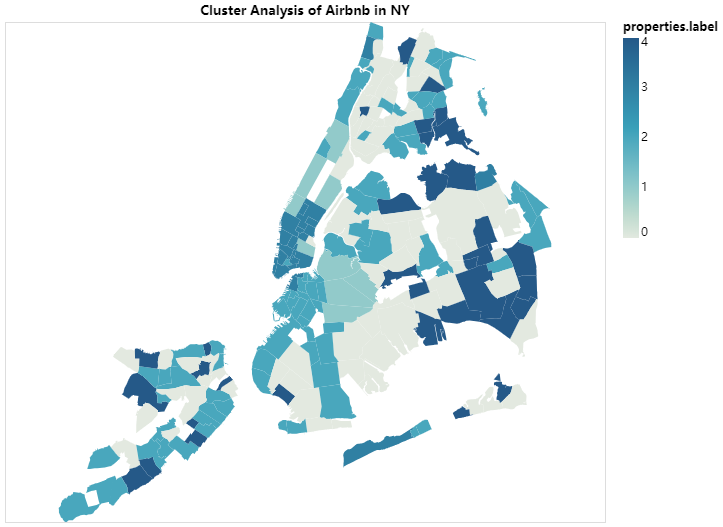

In [24]:
import altair as alt
alt.renderers.enable('notebook')
alt.data_transformers.disable_max_rows()
alt.data_transformers.enable('json')

cluster_data = alt.InlineData(
    values=cluster.to_crs(epsg=4326).to_json(),
    format=alt.DataFormat(property="features", type="json"),
)

cluster=alt.Chart(cluster_data).mark_geoshape().properties(
    width=600, height=500,title="Cluster Analysis of Airbnb in NY",
).encode(
    tooltip=["properties.neighbourhood:N","properties.label:Q","properties.count:Q","properties.price_per_person:Q","properties.review_scores_rating:Q"],
    color=alt.Color("properties.label:Q", scale=alt.Scale(scheme='lighttealblue'))
)

cluster.save('./diagram/altair_cluster.json')
cluster

## Part 3 Find the Top-Earned Airbnb for Hosts in New York 

### 3.1 Calculate the potential monthly yield of Airbnb

According to a official data from Airbnb company (https://blog.atairbnb.com/economic-impact-airbnb/), In New York, the Airbnb visitors stay on average 6.4 nights. Besides, a review rate of 50% was chosen to convert reviews to estimated bookings based on the past experience of Airbnb company (http://insideairbnb.com/about.html).

***yield_per_month = Average length of stay * price * (number of reviews per mouth /review rate)***

In [25]:
# calculate the average monthly yield
airbnb["yield"]=airbnb["price"]*airbnb["reviews_per_month"]*6.4*2

In [26]:
# sort by yield
airbnb=airbnb.sort_values(by="yield" , ascending=False)
airbnb.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800


In [27]:
len(airbnb)

38709

### 3.2 Reasons behind the yield differences (visualize by hvplot)

we classify the monthly yield into 3 categories: high-yield (Top 30%), median-yield (30%-70%), low-yield (70%-100%)

In [28]:
airbnb["yield"].quantile(0.3) 

339.20000000000005

In [29]:
airbnb["yield"].quantile(0.7) 

2316.5951999999993

In [30]:
airbnb.loc[airbnb["yield"]<=340,'yield_type'] = "low"
airbnb.loc[(airbnb["yield"]>340)&(airbnb["yield"]<=2316),'yield_type'] = "median"
airbnb.loc[(airbnb["yield"]>2316),'yield_type'] = "high"

In [31]:
airbnb.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high


In [32]:
#BBDED6  #61C0BF #11999E
import hvplot.pandas

by_yieldtype=airbnb.groupby(["yield_type","host_year"])["count"].sum()
by_yield_chart=by_yieldtype.hvplot(x='host_year',groupby='yield_type',color="#71c9ce",line_color="white",width=190,height=200,rot=45,fontsize=1,kind='bar')

high = by_yield_chart['high'].relabel('high yield')
median = by_yield_chart['median'].relabel('median yield')
low = by_yield_chart['low'].relabel('low yield')
combined=high+median+low
hvplot.save(combined, './diagram/hvplot_host_year.html')

combined

:Layout
   .Bars.High_yield   :Bars   [host_year]   (count)
   .Bars.Median_yield :Bars   [host_year]   (count)
   .Bars.Low_yield    :Bars   [host_year]   (count)

In [33]:
by_yieldtype=airbnb.groupby(["yield_type","host_response_time"])["count"].sum()
by_yield_chart=by_yieldtype.hvplot.bar(x="host_response_time",groupby='yield_type',line_color="white",color="#71c9ce",
                width=190,height=200,rot=30,legend='top_left')

high = by_yield_chart['high'].relabel('high yield')
median = by_yield_chart['median'].relabel('median yield')
low = by_yield_chart['low'].relabel('low yield')
combined=high+median+low
hvplot.save(combined, './diagram/hvplot_response_time.html')

combined

:Layout
   .Bars.High_yield   :Bars   [host_response_time]   (count)
   .Bars.Median_yield :Bars   [host_response_time]   (count)
   .Bars.Low_yield    :Bars   [host_response_time]   (count)

In [34]:
by_yieldtype=airbnb.groupby(["yield_type","host_identity_verified"])["count"].sum()
by_yield_chart=by_yieldtype.hvplot.bar(x="host_identity_verified",groupby='yield_type',line_color="white",color="#71c9ce",
                                       width=190,height=200,rot=45,legend='top_left')

high = by_yield_chart['high'].relabel('high yield')
median = by_yield_chart['median'].relabel('median yield')
low = by_yield_chart['low'].relabel('low yield')
combined=high+median+low
hvplot.save(combined, './diagram/hvplot_host_identity.html')

combined

:Layout
   .Bars.High_yield   :Bars   [host_identity_verified]   (count)
   .Bars.Median_yield :Bars   [host_identity_verified]   (count)
   .Bars.Low_yield    :Bars   [host_identity_verified]   (count)

In [35]:
by_yieldtype=airbnb.groupby(["yield_type","instant_bookable"])["count"].sum()
by_yield_chart=by_yieldtype.hvplot.bar(x="instant_bookable",groupby='yield_type',line_color="white",color="#71c9ce",
                 stacked=True,width=190,height=200,rot=45,legend='top_left')

high = by_yield_chart['high'].relabel('high yield')
median = by_yield_chart['median'].relabel('median yield')
low = by_yield_chart['low'].relabel('low yield')
combined=high+median+low
hvplot.save(combined, './diagram/hvplot_instant_bookable.html')

combined

:Layout
   .Bars.High_yield   :Bars   [instant_bookable]   (count)
   .Bars.Median_yield :Bars   [instant_bookable]   (count)
   .Bars.Low_yield    :Bars   [instant_bookable]   (count)

### 3.3 Characterictics of the high-yield airbnb in NY (visualize by altair)

##### Spatial distribution of top 5000 high-yield airbnb in NY 

In [36]:
# instantiate a mark cluster object for the airbnb with top 15% yield in NY
from folium import plugins
base_map=generateBaseMap_black()

# create the mark cluster
data_5000 = airbnb.iloc[0:5000, :]
air_cluster = plugins.MarkerCluster().add_to(base_map)
# loop through the dataframe and add each data point to the mark cluster
for lat,lng,label in zip(data_5000.latitude,data_5000.longitude,data_5000.name):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label
    ).add_to(air_cluster)

folium_cluster=base_map.add_child(air_cluster)
folium_cluster.save("./diagram/folium_cluster.html")

In [37]:
#data = airbnb[airbnb["yield_type"]=="high"]
columns=['id','name', 'description', 'host_id', 'host_since', 'host_response_rate', 'host_identity_verified', 'host_response_time',
 'instant_bookable', 'neighbourhood_group', 'neighbourhood','latitude', 'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
 'beds', 'price', 'guests_included', 'minimum_nights', 'availability_30', 'number_of_reviews',
 'review_scores_rating', 'last_review', 'reviews_per_month', 'cancellation_policy',"host_year","count","price_per_person","yield"]

data=pd.DataFrame(data_5000, columns=columns)
data.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,count,price_per_person,yield
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,1,300.000000,63129.600
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,1,59.375000,52774.400
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,1,59.888889,51744.000
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,1,133.000000,49948.416
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,1,65.000000,47756.800


In [38]:
import altair as alt

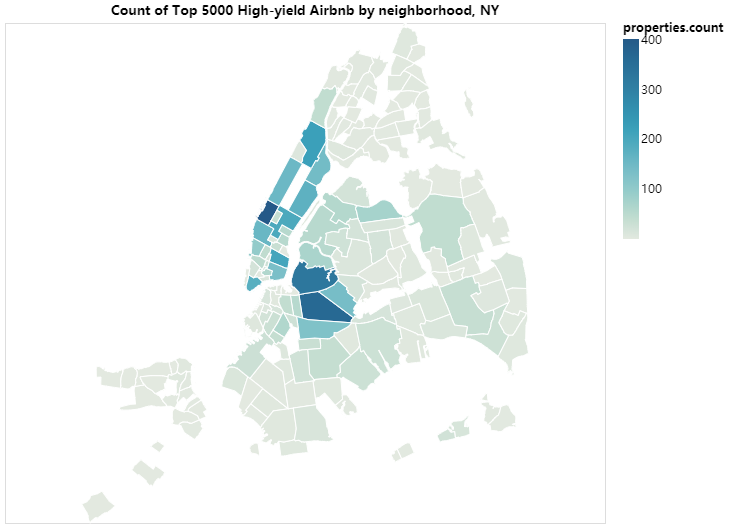

In [39]:
# calculate the high-yield airbnb count & mean price by neighborhood
group_data1=data.groupby(["neighbourhood"])["price"].mean()
group_data1=pd.DataFrame(group_data1).reset_index()
group_data2=data.groupby(["neighbourhood"])["count"].count()
group_data2=pd.DataFrame(group_data2).reset_index()

group_data=pd.merge(group_data1,group_data2,on="neighbourhood")
group_data=neighbor.merge(group_data,on="neighbourhood")
group_data=group_data.rename(columns={0:"count"})

group_data = alt.InlineData(
    values=group_data.to_crs(epsg=4326).to_json(),
    format=alt.DataFormat(property="features", type="json"),
)

# plot map, where variables ares nested within `properties`,
chart=alt.Chart(group_data).mark_geoshape(stroke="white").encode(
    tooltip=["properties.count:Q", "properties.neighbourhood:N","properties.price:Q"],
    color=alt.Color("properties.count:Q", scale=alt.Scale(scheme='lighttealblue'))
).properties(
    title="Count of Top 5000 High-yield Airbnb by neighborhood, NY",
    projection={"type": "mercator"},
    width=600,
    height=500
)

chart.save('./diagram/altair_count_neibor.json')
chart

In [40]:
alt.data_transformers.disable_max_rows()
alt.data_transformers.enable('json')

DataTransformerRegistry.enable('json')

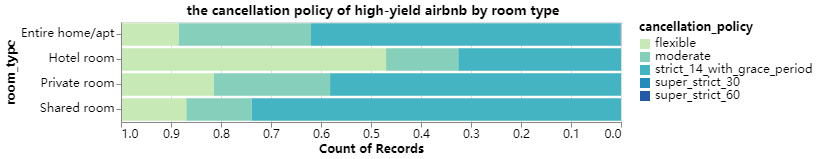

In [41]:
chart=alt.Chart(data).mark_bar().encode(
    x=alt.X('*:Q', aggregate='count', sort='descending',stack='normalize'),
    y='room_type',
    color=alt.Color('cancellation_policy',scale=alt.Scale(scheme="yellowgreenblue"))).properties( 
    title=" the cancellation policy of high-yield airbnb by room type",
    width=500, 
    height=100)#.interactive()

chart

In [42]:
with alt.data_transformers.enable('default'):
    chart.save('./diagram/altair_cancellation.json')

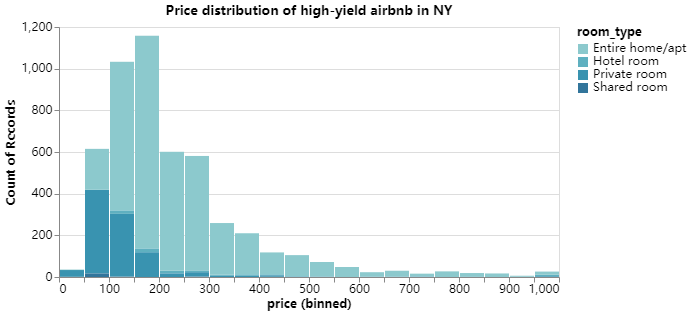

In [43]:
chart=alt.Chart(data).mark_bar().encode(
    x=alt.X('price', bin=alt.Bin(maxbins=40)),
    y='count()',
    color=alt.Color('room_type', scale=alt.Scale(scheme="tealblues")),
).properties( 
    title="Price distribution of high-yield airbnb in NY",
    width=500, 
    height=250)

chart

In [44]:
with alt.data_transformers.enable('default'):
    chart.save('./diagram/altair_price_distribution.json')

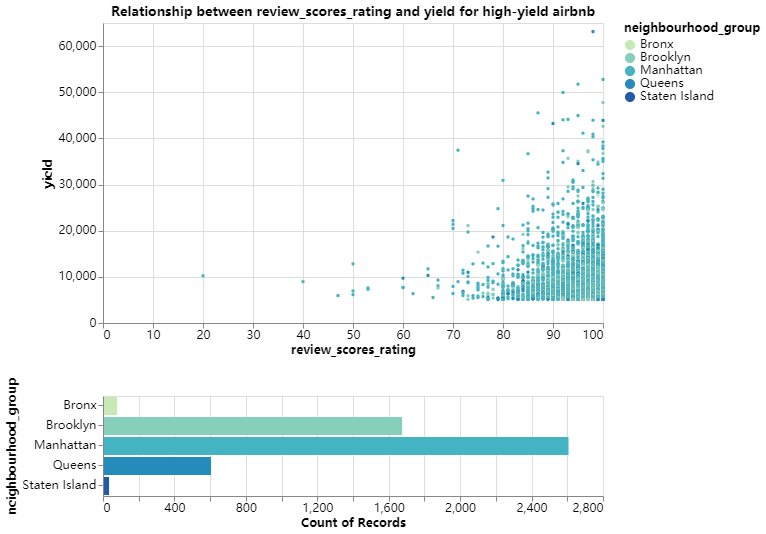

In [45]:
brush = alt.selection(type='interval')
point=alt.Chart(data).mark_circle(size=10).encode(
     x="review_scores_rating",
     y="yield",
     color=alt.condition(brush,"neighbourhood_group",alt.value('lightgray'),scale=alt.Scale(scheme="yellowgreenblue")),
     tooltip=["yield","price","reviews_per_month","host_year","host_response_rate","count()"]
).properties(
    title="Relationship between review_scores_rating and yield for high-yield airbnb",
    width=500, 
    height=300,
    selection=brush,
)

bars=alt.Chart().mark_bar().encode(
    y="neighbourhood_group",
    color=alt.condition(brush,"neighbourhood_group",alt.value('lightgray'),scale=alt.Scale(scheme="yellowgreenblue")),
    x="count(neighbourhood_group)",
).transform_filter(
        brush.ref()
).properties(
width=500,
height=100
)

chart=alt.vconcat(point,bars,data=data)
chart

In [46]:
with alt.data_transformers.enable('default'):
    chart.save('./diagram/altair_relationship.json')

In [47]:
data["name"] = data["name"].astype(str)
list_name=data["name"].tolist()

In [48]:
words_in_list=[word.lower().split()
              for word in list_name]

In [49]:
# get the list of commmon stop words
import nltk
nltk.download('stopwords');
stop_words = list(set(nltk.corpus.stopwords.words('english')))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [50]:
# get the list of commmon punctuation
import string
punctuation = list(string.punctuation)

In [51]:
# Remove ignored words from each list of words
ignored=stop_words+punctuation
name_nsw = [[word for word in name_words if word not in ignored]
              for name_words in words_in_list]
name_nsw[0]

['luxury', 'house', 'safe', 'area,', '30', 'min', 'time', 'square']

In [52]:
# Remove number and several common words from each list of words
search_terms = ["1","2","3","4","5","east","west","noth","south","min","hour","apartment","bedroom","room"]
name_nsw = [[w for w in word if w not in search_terms]
                 for word in name_nsw]

In [53]:
def count_word_frequencies(words_in_name, top=60):
    """
    Given a list of all words for every tweet, count
    word frequencies across all tweets.
    
    By default, this returns the top 15 words, but you 
    can specify a different value for `top`.
    """
    import itertools, collections

    # List of all words across tweets
    all_words = list(itertools.chain(*words_in_name))

    # Create counter
    counter = collections.Counter(all_words)
    
    return pd.DataFrame(counter.most_common(top),
                        columns=['words', 'count'])

In [54]:
counts_nsw = count_word_frequencies(name_nsw)
len(counts_nsw)

60

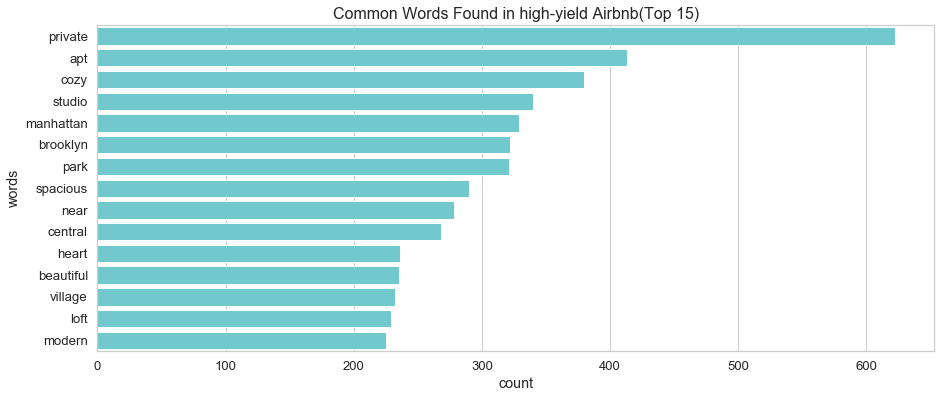

In [55]:
# plot the Top 15 most common words in hish-yield Airbnb Name
fx,ax=plt.subplots(figsize=(15,6))

sns.set(style='whitegrid',font_scale=1.2)

sns.barplot(
    y="words",
    x="count",
    data=counts_nsw.sort_values(by="count", ascending=False).iloc[0:15, :],
    ax=ax,
    color="#71c9ce",
    saturation=1.0,
)

ax.set_title("Common Words Found in high-yield Airbnb(Top 15)", fontsize=16);
plt.savefig('./diagram/word_frequency',bbox_inches='tight')

In [56]:
words=counts_nsw["words"].tolist()
word_txt=" ".join(words)

from wordcloud import WordCloud
wordcloud=WordCloud(scale=4,background_color="white",font_path="C:\Windows\Fonts\Arial.ttf",
           max_words=60,max_font_size=60,random_state=20).generate(word_txt)


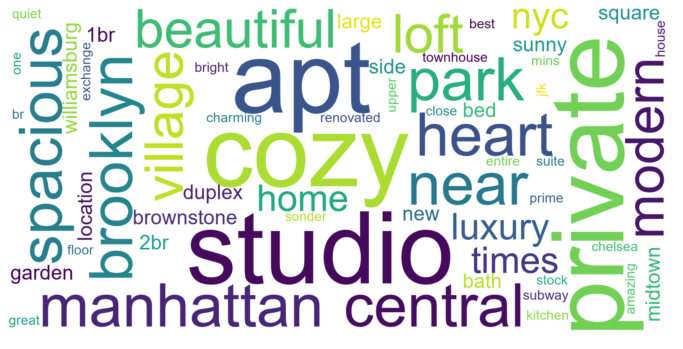

In [57]:
# plot the windcloud of high-yield Airbnb
fig, ax = plt.subplots(figsize=(12, 10))
plt.imshow(wordcloud, interpolation="bilinear")
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/wordcloud',bbox_inches='tight')

## Part 4 Pricing Tip Prediction for New Hosts in New York 

### 4.1 Price spatial distribution of New York airbnb (visualized by matplotlib)

In [58]:
# Convert the airbnb data into geodataframe
from shapely.geometry import Point
airbnb["coor"]=list(zip(airbnb["longitude"],airbnb["latitude"]))
airbnb["coor"]=airbnb["coor"].apply(Point)
airbnb_gpd=gpd.GeoDataFrame(airbnb,geometry="coor",crs={'init': 'epsg:4326'}).to_crs(epsg=3857)
airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105)
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969)
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295)
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405)
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144)


In [59]:
# Clean the airbnb_gpd data
import seaborn as sns
import statsmodels
import statsmodels.api as sm
import scipy.stats as stats

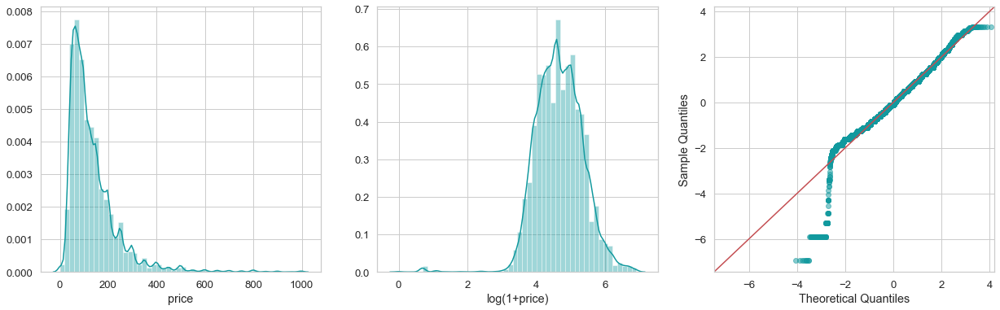

In [60]:
fig, axes = plt.subplots(1,3, figsize=(21,6))
chart=sns.distplot(airbnb_gpd['price'], ax=axes[0],color="#11999E")
chart=sns.distplot(np.log1p(airbnb_gpd['price']), ax=axes[1],color="#11999E")
axes[1].set_xlabel('log(1+price)')
sm.qqplot(np.log1p(airbnb_gpd['price']), stats.norm, fit=True, line='45',color="#11999E",alpha=0.5,ax=axes[2])

figure = chart.get_figure() 
figure.savefig("./diagram/hist_price.png",bbox_inches='tight')

In [61]:
airbnb_gpd = airbnb_gpd [(np.log1p(airbnb_gpd ['price']) < 8) & (np.log1p(airbnb_gpd ['price']) >3)]
airbnb_gpd=airbnb_gpd.dropna()

In [62]:
len(airbnb_gpd)

26624

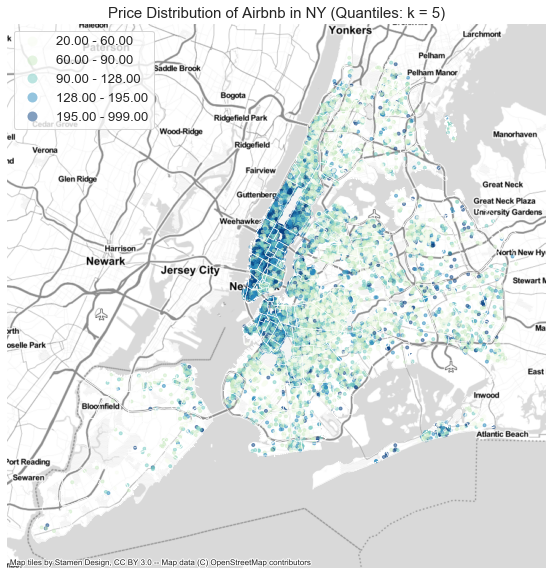

In [63]:
import contextily as ctx

# create the axes
fig, ax = plt.subplots(figsize=(10, 10))

# plot a random sample of potholes
airbnb_gpd.plot(ax=ax, marker='.', column="price" ,cmap="GnBu",alpha=0.5,
            legend=True,legend_kwds=dict(loc='upper left'),scheme="Quantiles",k=5) 

# add the Neighbor boundary
neighbor.plot(ax=ax, edgecolor='white', linewidth=0.5, facecolor='none')

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

#CartoDB.Positron
# remove axis lines
ax.set_title("Price Distribution of Airbnb in NY (Quantiles: k = 5)",fontsize=15)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/airbnb_price',bbox_inches='tight')

In [64]:
# spatial join
air_nei=gpd.sjoin(airbnb_gpd,neighbor,op="within",how="right")
air_nei.reset_index().head()

# calculate the airbnb count by neighborhood
group=airbnb.groupby(["neighbourhood"])["price"].mean()
group=pd.DataFrame(group).reset_index()

group=neighbor.merge(group,on="neighbourhood")
group=group.rename(columns={0:"count"})
group.head()

,neighbourhood,neighbourhood_group,geometry,price
0,Bayswater,Queens,(POLYGON ((-8211672.372056099 4955705.98588607...,85.142857
1,Bayswater,Queens,(POLYGON ((-8211489.474132727 4955509.04187944...,85.142857
2,Allerton,Bronx,(POLYGON ((-8220788.21383767 4993431.405621486...,90.214286
3,City Island,Bronx,(POLYGON ((-8213466.174330741 4989346.93912581...,98.461538
4,City Island,Bronx,(POLYGON ((-8213660.983439631 4991671.62690924...,98.461538


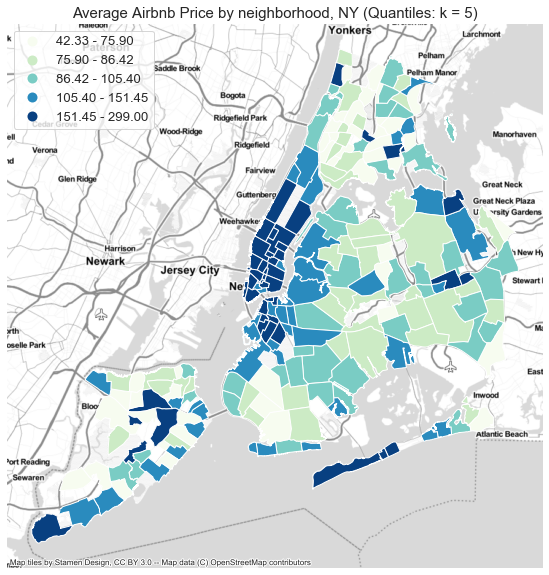

In [65]:
# Needed to line up the colorbar properly
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Create the figure
fig, ax = plt.subplots(figsize=(10, 10),facecolor="white")

# Plot
group.plot( ax=ax,
    column="price",
    edgecolor="white",
    legend=True,
    legend_kwds=dict(loc='upper left'),
    cmap="GnBu",
    scheme="Quantiles",
    k=5)

# NEW: Get the limits of the GeoDataFrame
xmin, ymin, xmax, ymax = group.total_bounds

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

# NEW: Set the xlims and ylims
#ax.set_xlim(xmin, xmax)
#ax.set_ylim(ymin, ymax)

# Format
ax.set_title("Average Airbnb Price by neighborhood, NY (Quantiles: k = 5)",size=15)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/average_price_neighbor',bbox_inches='tight')

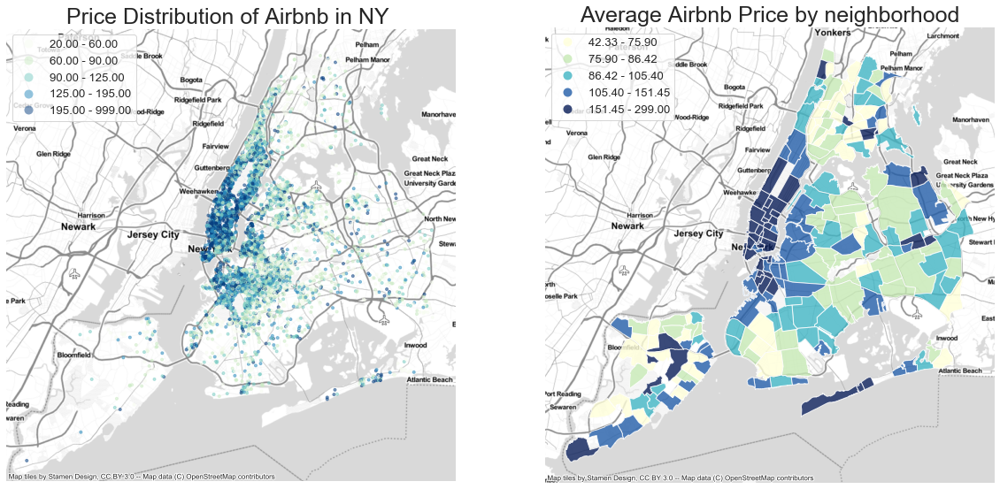

In [106]:
# Plot two columns
fig, axs = plt.subplots(ncols=2, figsize=(20,10))

# Predicted values
test_set.plot(ax=axs[0], column='price', marker='.',cmap="GnBu",alpha=0.5,
            legend=True,legend_kwds=dict(loc='upper left'),scheme="Quantiles",k=5)
ctx.add_basemap(ax=axs[0], crs=test_set.crs, url=ctx.providers.Stamen.TonerLite)
axs[0].set_title("Price Distribution of Airbnb in NY ",size=25)

# Actual values
group.plot(ax=axs[1],column="price",edgecolor="white",alpha=0.8,
              legend=True,legend_kwds=dict(loc='upper left'),cmap="YlGnBu",scheme="Quantiles",k=5)
ctx.add_basemap(ax=axs[1], crs=test_set.crs, url=ctx.providers.Stamen.TonerLite)
axs[1].set_title("Average Airbnb Price by neighborhood",size=25)

axs[0].set_axis_off()
axs[1].set_axis_off()
plt.savefig('./diagram/combine.png',bbox_inches='tight')

### 4.2 Feature Engineering

In [66]:
import missingno as msno

In [67]:
# visualize the first half of columns and then the second half
ncol =len(airbnb_gpd.columns)
fields1=airbnb.columns

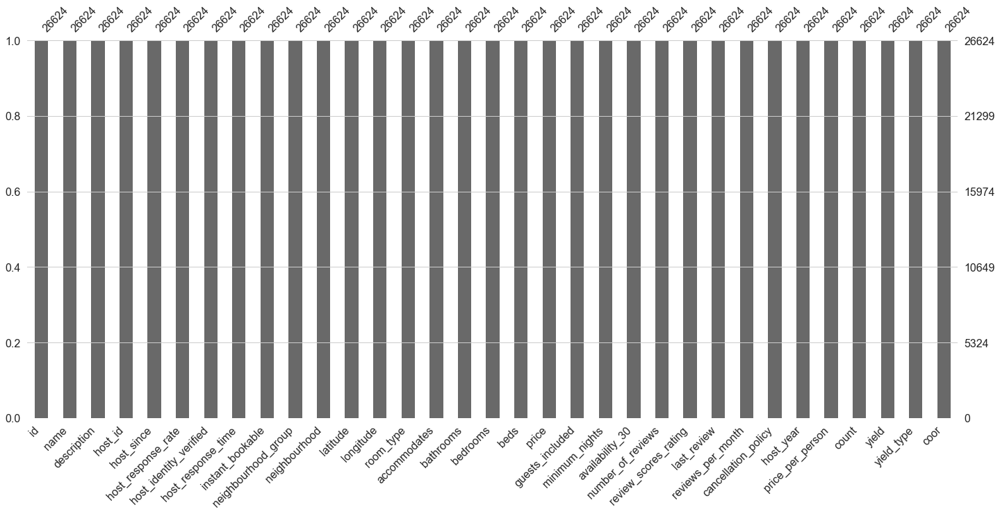

In [68]:
msno.bar(airbnb_gpd[fields1])

In [69]:
len(airbnb_gpd)

26624

###### Add the logDistCrime variable (NYPD Complaint data)

This dataset includes all valid felony, misdemeanor, and violation crimes reported to the New York City Police Department (NYPD) for all complete quarters so far this year (2019). 

In [70]:
# KNN method
from sklearn.neighbors import NearestNeighbors
import numpy as np

def get_xy_from_geometry(df):
    """
    Return a numpy array with two columns, where the 
    first holds the `x` geometry coordinate and the second 
    column holds the `y` geometry coordinate
    """
    x = df.geometry.x
    y = df.geometry.y
    
    return np.column_stack((x, y)) 

In [71]:
from sodapy import Socrata
client = Socrata("data.cityofnewyork.us",
                 "hpqFYZsalD4giiukGuLjAa4jt",
                 username="lzq.hust@gmail.com",
                 password="Lzq8685963!",
                 timeout=1000000)

In [72]:
# load the crime data
where="cmplnt_to_dt >= '2018-01-01' and cmplnt_to_dt <= '2019-01-01'"
results = client.get("qgea-i56i",where=where,select="latitude,longitude",limit=1000000)
crime = pd.DataFrame.from_records(results).dropna()

In [73]:
# convert the complaint dataframe into geodataframe
crime[["latitude","longitude"]] = crime[["latitude","longitude"]].astype(float)
crime["geometry"]=list(zip(crime["longitude"],crime["latitude"]))
crime["geometry"]=crime["geometry"].apply(Point)
crime=gpd.GeoDataFrame(crime,geometry="geometry",crs={'init': 'epsg:4326'}).to_crs(epsg=3857)
crime.head()

,latitude,longitude,geometry
0,40.683702,-73.875598,POINT (-8223793.993376024 4965799.134445083)
1,40.805705,-73.912735,POINT (-8227927.9989592 4983725.251784862)
2,40.750936,-74.004044,POINT (-8238092.468562926 4975673.934954111)
3,40.712655,-73.989974,POINT (-8236526.185516353 4970050.249267844)
4,40.638881,-73.943940,POINT (-8231401.751944553 4959221.757633395)


In [74]:
# Extract x/y for airbnb_gpd and complaint
airbnbXY=get_xy_from_geometry(airbnb_gpd)
crimeXY=get_xy_from_geometry(crime)

In [75]:
# KNN method
# STEP 1: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=5)
# STEP 2: Fit the algorithm on the "neighbors" dataset
nbrs.fit(crimeXY)
# STEP 3: Get distances for airbnb to 
criDists, criIndices = nbrs.kneighbors(airbnbXY)
# Average distance to neighbors
avgCriDist = criDists.mean(axis=1)
# Set zero distances to be small, but nonzero
# IMPORTANT: THIS WILL AVOID INF DISTANCES WHEN DOING THE LOG
avgCriDist[avgCriDist==0] = 1e-5
# Calculate log of distances
airbnb_gpd['logDistCrime'] = np.log10(avgCriDist)

airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041


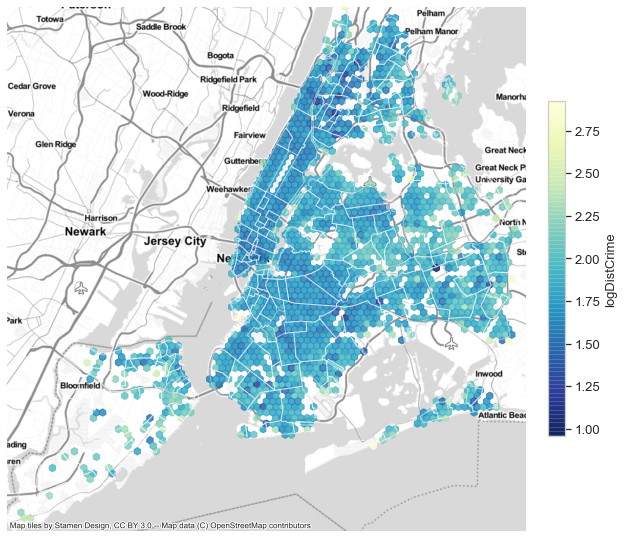

In [76]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the Graffiti distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistCrime'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistCrime',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/crime',bbox_inches='tight')

###### Add the  logDistDirty variable ( 311 requests Noise)

In [77]:
# load the requests data
where = "created_date >= '2018-01-01' and created_date < '2019-01-01' and complaint_type = 'Dirty Conditions'"
results = client.get("erm2-nwe9",where=where,select="Latitude, Longitude",limit=1000000)
dirty = pd.DataFrame.from_records(results).dropna()
dirty.head()

,Latitude,Longitude
0,40.71741105389313,-73.76110363528335
1,40.581830570219736,-73.95637793933014
2,40.7585192921029,-73.84442527636939
3,40.742946866747495,-73.92536687866857
5,40.69611234569536,-73.99368186450546


In [78]:
# convert the streetlight dataframe into geodataframe
dirty[["Latitude","Longitude"]] = dirty[["Latitude","Longitude"]].astype(float)
dirty["geometry"]=list(zip(dirty["Longitude"],dirty["Latitude"]))
dirty["geometry"]=dirty["geometry"].apply(Point)
dirty=gpd.GeoDataFrame(dirty,geometry="geometry",crs={'init': 'epsg:4326'}).to_crs(epsg=3857)
dirty.head()

,Latitude,Longitude,geometry
0,40.717411,-73.761104,POINT (-8211048.497029622 4970748.789751573)
1,40.581831,-73.956378,POINT (-8232786.333121122 4950856.063409917)
2,40.758519,-73.844425,POINT (-8220323.81968738 4976788.298578027)
3,40.742947,-73.925367,POINT (-8229334.197639317 4974500.001703715)
5,40.696112,-73.993682,POINT (-8236938.987076229 4967621.109096254)


In [79]:
# KNN method

dirtyXY=get_xy_from_geometry(dirty)

# STEP 1: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=3)
# STEP 2: Fit the algorithm on the "neighbors" dataset
nbrs.fit(dirtyXY)
# STEP 3: Get distances for airbnb to 
dirtyDists, dirtyIndices = nbrs.kneighbors(airbnbXY)
# Average distance to neighbors
avgdirtyDist = dirtyDists.mean(axis=1)
# Set zero distances to be small, but nonzero
# IMPORTANT: THIS WILL AVOID INF DISTANCES WHEN DOING THE LOG
avgdirtyDist[avgdirtyDist==0] = 1e-5
# Calculate log of distances
airbnb_gpd['logDistDirty'] = np.log10(avgdirtyDist)

airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282


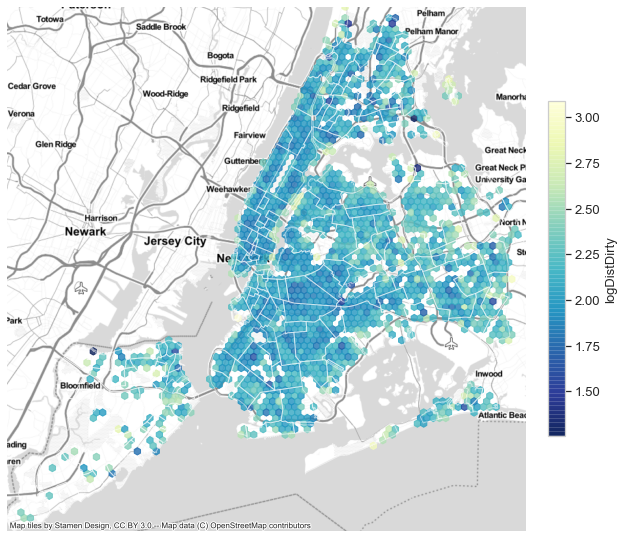

In [80]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the crime distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistDirty'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistDirty',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)
# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/dirty',bbox_inches='tight')

###### Add the  logDistNoise variable ( 311 requests Noise)

In [81]:
# load the requests data
where = "created_date >= '2018-01-01' and created_date < '2019-01-01' and complaint_type = 'Noise'"
results = client.get("erm2-nwe9",where=where,select="Latitude, Longitude",limit=1000000)
Noise = pd.DataFrame.from_records(results).dropna()
Noise.head()

,Latitude,Longitude
0,40.74883748706737,-73.87260248011808
1,40.79455899221026,-73.96627150428745
2,40.77300782211434,-73.98014998881543
3,40.79931377582617,-73.9531762007941
4,40.72943182997348,-73.97802700657319


In [82]:
# convert the streetlight dataframe into geodataframe
Noise[["Latitude","Longitude"]] = Noise[["Latitude","Longitude"]].astype(float)
Noise["geometry"]=list(zip(Noise["Longitude"],Noise["Latitude"]))
Noise["geometry"]=Noise["geometry"].apply(Point)
Noise=gpd.GeoDataFrame(Noise,geometry="geometry",crs={'init': 'epsg:4326'}).to_crs(epsg=3857)
Noise.head()

,Latitude,Longitude,geometry
0,40.748837,-73.872602,POINT (-8223460.491660663 4975365.538474261)
1,40.794559,-73.966272,POINT (-8233887.679734299 4982086.22495832)
2,40.773008,-73.980150,POINT (-8235432.625564937 4978917.803410556)
3,40.799314,-73.953176,POINT (-8232429.917217638 4982785.404774399)
4,40.729432,-73.978027,POINT (-8235196.296262768 4972514.462923164)


In [83]:
# KNN method
NoiseXY=get_xy_from_geometry(Noise)

# STEP 1: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=1)
# STEP 2: Fit the algorithm on the "neighbors" dataset
nbrs.fit(NoiseXY)
# STEP 3: Get distances for airbnb to 
NoiseDists, NoiseIndices = nbrs.kneighbors(airbnbXY)
# Average distance to neighbors
avgNoiseDist = NoiseDists.mean(axis=1)
# Set zero distances to be small, but nonzero
# IMPORTANT: THIS WILL AVOID INF DISTANCES WHEN DOING THE LOG
avgNoiseDist[avgNoiseDist==0] = 1e-5
# Calculate log of distances
airbnb_gpd['logDistNoise'] = np.log10(avgNoiseDist)

airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty,logDistNoise
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232,2.049483
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374,0.977596
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754,1.832042
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499,0.783409
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282,1.852523


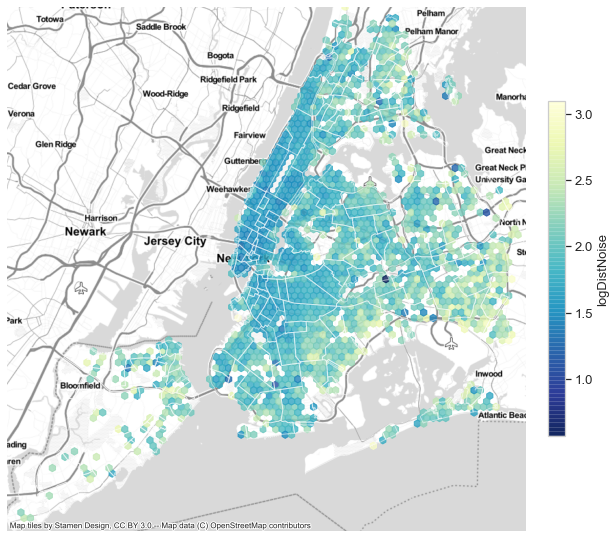

In [84]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the Graffiti distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistNoise'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistNoise',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/noise',bbox_inches='tight')

###### Add the logDisUni variable ( University data)

In [85]:
url="https://data.cityofnewyork.us/api/geospatial/4kym-4xw5?method=export&format=GeoJSON"
uni=gpd.read_file(url).to_crs(epsg=3857)
uni.head()

,city,name,zip,url,bbl,streetname,housenum,bin,geometry
0,New York,New School University / Parsons School Of Design,10011,http://www.parsons.edu/html/splash.html,1005760042,FIFTH AVENUE,66,1009619,POINT (-8237046.999272317 4973361.270931754)
1,New York,New School University / The New School,10011,http://www.newschool.edu/,1005750017,WEST 12 STREET,66,1083136,POINT (-8237316.115168569 4973400.444303175)
2,New York,Metropolitan College,10013,http://www.metropolitan.edu/,1002260001,VARICK STREET,75,1002934,POINT (-8238401.455683141 4971634.58544787)
3,Fresh Meadows,School Of Nursing Of St. Vincents Catholic Med...,11365,http://www.svcmc.org/portal/training/allied_he...,4068890037,HORACE HARDING EXPRESSWAY,175-05,4148794,POINT (-8214754.252247361 4973985.179216026)
4,Forest Hills,Bramson Ort College,11375,http://www.bramsonort.org/,4032347501,AUSTIN STREET,69-30,4077468,POINT (-8220801.966259549 4971330.541977497)


In [86]:
# KNN method

uniXY=get_xy_from_geometry(uni)

# STEP 1: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=1)
# STEP 2: Fit the algorithm on the "neighbors" dataset
nbrs.fit(uniXY)
# STEP 3: Get distances for airbnb to 
uniDists, uniIndices = nbrs.kneighbors(airbnbXY)
# Average distance to neighbors
avguniDist =uniDists.mean(axis=1)
# Set zero distances to be small, but nonzero
# IMPORTANT: THIS WILL AVOID INF DISTANCES WHEN DOING THE LOG
avguniDist[avguniDist==0] = 1e-5
# Calculate log of distances
airbnb_gpd['logDistUni'] = np.log10(avguniDist)

airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty,logDistNoise,logDistUni
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232,2.049483,3.118921
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374,0.977596,2.396151
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754,1.832042,3.032535
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499,0.783409,2.935673
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282,1.852523,2.913817


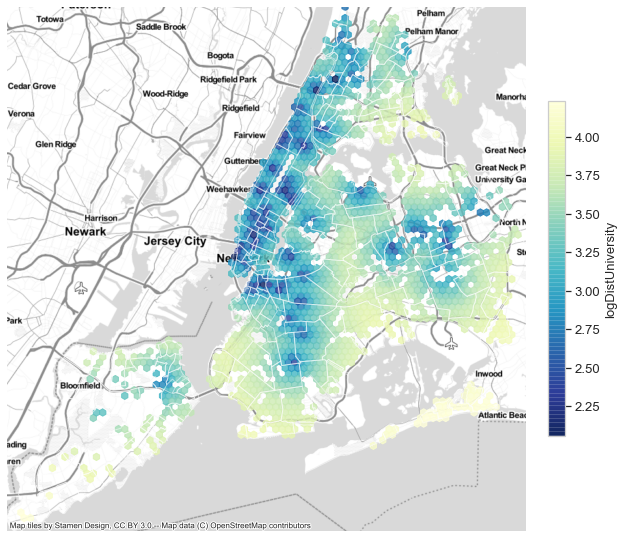

In [87]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the Graffiti distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistUni'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistUniversity',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/university',bbox_inches='tight')

###### Add the logDistAttr variable ( attraction data)

In [88]:
import osm2gpd
lng_min, lat_min, lng_max, lat_max = neighbor.to_crs(epsg=4326).total_bounds
where="tourism=attraction"
attraction = osm2gpd.get(lng_min, lat_min, lng_max, lat_max, where=where).to_crs(epsg=3857)
attraction = gpd.sjoin(attraction, neighbor, op="within")
attraction.head()

,lat,lon,ele,gnis:Class,gnis:County,gnis:County_num,gnis:ST_alpha,gnis:ST_num,gnis:id,import_uuid,is_in,name,name:ru,name:zh,place,tourism,wikidata,wikipedia,wheelchair,addr:city,addr:country,addr:housenumber,addr:postcode,addr:state,addr:street,amenity,gnis:county_name,gnis:feature_id,gnis:import_uuid,gnis:reviewed,lgbtq,website,fixme,note,source:position,source:tourism,attraction,name:en,historic,name:ko,opening_hours,phone,barrier,start_date,email,heritage,heritage:operator,ref:nrhp,craft,distillery,name:it,name:es,name:fr,tourism_1,ref:njrhp,name:de,description,leisure,operator,natural,species,species:en,tree:diameter,type,highway,artwork_type,alt_name:en,geometry,index_right,neighbourhood,neighbourhood_group
158809984,40.722880,-73.998750,9,Populated Place,New York,061,NY,36,2045148,bb7269ee-502a-5391-8056-e3ce0e66489c,"New York,New York,N.Y.,NY,USA",SoHo,Сохо,纽约苏活（Soho）区,neighbourhood,attraction,Q461572,"en:SoHo, Manhattan",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8237503.224998497 4971552.057034572),179,SoHo,Manhattan
5017059024,40.718987,-74.000862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Canal street market,NaN,NaN,NaN,attraction,NaN,NaN,NaN,NaN,NaN,261,10013,NaN,Canal Street,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8237738.287235258 4970980.239939673),179,SoHo,Manhattan
5449742521,40.722690,-74.003303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Paul Nicklen Gallery,NaN,NaN,NaN,attraction,NaN,NaN,NaN,NaN,NaN,NaN,10013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,http://www.paulnicklengallery.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mo-Su 12:00-19:00,+16468910042,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8238009.995848385 4971524.178504917),179,SoHo,Manhattan
6052834699,40.725844,-74.006223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Color Factory,NaN,NaN,NaN,attraction,NaN,NaN,NaN,NaN,NaN,251,NaN,NaN,Spring Street,NaN,NaN,NaN,NaN,NaN,NaN,http://colorfactory.co,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Th-Tu 10:00-23:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8238335.015365655 4971987.489445647),179,SoHo,Manhattan
6949654787,40.721829,-73.999589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Haughwout Building,NaN,NaN,NaN,attraction,NaN,NaN,NaN,NaN,NaN,488,NaN,NaN,Broadway,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8237596.610919326 4971397.75668658),179,SoHo,Manhattan


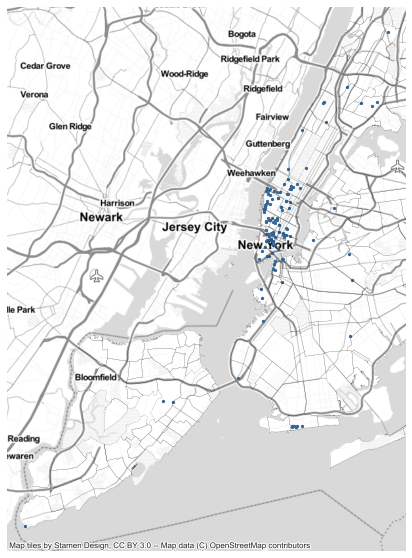

In [89]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot the subway locations
attraction.plot(ax=ax, markersize=5, color='#336699')
# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

# City limits, too
neighbor.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.1)

ax.set_axis_off()
plt.savefig('./diagram/detail/attraction',bbox_inches='tight')

In [90]:
# STEP 1: x/y coordinates of subway stops (in EPGS=3857)
attractionXY = get_xy_from_geometry(attraction)

# STEP 2: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=3)

# STEP 3: Fit the algorithm on the "neighbors" dataset
nbrs.fit(attractionXY)

# STEP 4: Get distances for sale to neighbors
attractionDists, attractionIndices = nbrs.kneighbors(airbnbXY)

# STEP 5: add back to the original dataset
airbnb_gpd['logDistAttr'] = np.log10(attractionDists[:,0])
airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty,logDistNoise,logDistUni,logDistAttr
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232,2.049483,3.118921,3.904160
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374,0.977596,2.396151,3.073523
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754,1.832042,3.032535,2.973833
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499,0.783409,2.935673,2.551740
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282,1.852523,2.913817,3.426471


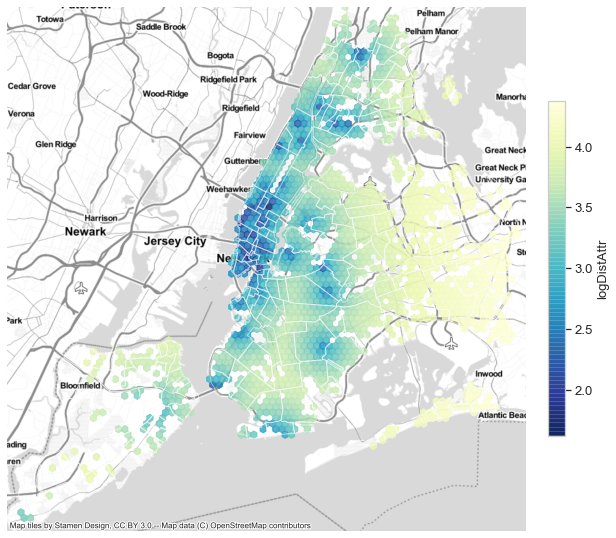

In [91]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the Graffiti distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistAttr'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistAttr',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/attraction',bbox_inches='tight')

###### Add the logDistSubway variable ( Subway station data)

In [92]:
import osm2gpd
lng_min, lat_min, lng_max, lat_max = neighbor.to_crs(epsg=4326).total_bounds
where="station=subway"
subway = osm2gpd.get(lng_min, lat_min, lng_max, lat_max, where=where).to_crs(epsg=3857)
subway = gpd.sjoin(subway, neighbor, op="within")
subway.head()

,lat,lon,name,network,public_transport,railway,station,subway,wheelchair,wikidata,opening_hours,operator,train,wikipedia,internet_access,internet_access:fee,name:en,name:ru,layer,name:es,name:nl,name:pl,alt_name,image,start_date,platforms,owner,toilets:wheelchair,name:pronunciation,name:he,name:lt,addr:city,addr:postcode,addr:state,note,location,iata,railway:ref,disused,disused:railway,check_date,opening_date,wifi,addr:housenumber,addr:street,fixme,website,description,geometry,index_right,neighbourhood,neighbourhood_group
42969559,40.643963,-74.073442,St. George,Staten Island Railway,station,station,subway,yes,yes,Q5927015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8245817.800217287 4959967.222330222),201,St. George,Staten Island
42969919,40.551335,-74.151201,Great Kills,Staten Island Railway,station,station,subway,yes,yes,Q5599393,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8254473.937029677 4946387.275455167),114,Great Kills,Staten Island
42969938,40.544446,-74.164901,Eltingville,Staten Island Railway,station,station,subway,yes,no,Q5367819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8255999.036317444 4945377.923548225),82,Eltingville,Staten Island
42969951,40.540534,-74.177904,Annadale,Staten Island Railway,station,station,subway,yes,no,Q4767761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8257446.512524281 4944804.937156003),180,Woodrow,Staten Island
42969964,40.533545,-74.191940,Huguenot,Staten Island Railway,station,station,subway,yes,no,Q5934692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-8259008.992897054 4943781.174410961),180,Woodrow,Staten Island


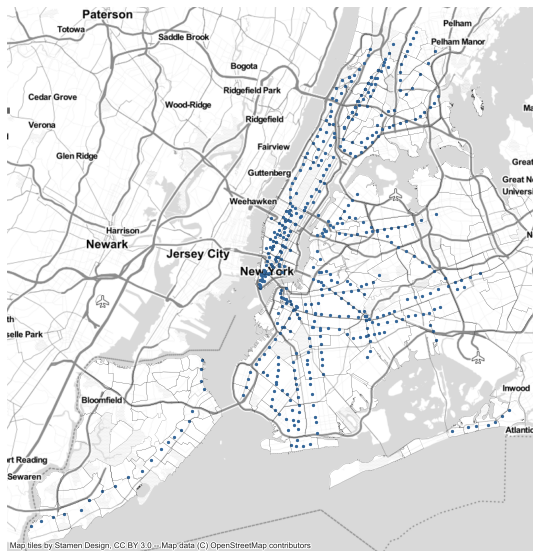

In [93]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot the subway locations
subway.plot(ax=ax, markersize=5, color='#336699')
# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

# City limits, too
neighbor.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.1)

ax.set_axis_off()
plt.savefig('./diagram/detail/subway_ori',bbox_inches='tight')

In [94]:
# STEP 1: x/y coordinates of subway stops (in EPGS=3857)
subwayXY = get_xy_from_geometry(subway)

# STEP 2: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=1)

# STEP 3: Fit the algorithm on the "neighbors" dataset
nbrs.fit(subwayXY)

# STEP 4: Get distances for sale to neighbors
subwayDists, subwayIndices = nbrs.kneighbors(airbnbXY)

# STEP 5: add back to the original dataset
airbnb_gpd['logDistSubway'] = np.log10(subwayDists[:,0])
airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty,logDistNoise,logDistUni,logDistAttr,logDistSubway
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232,2.049483,3.118921,3.904160,3.174705
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374,0.977596,2.396151,3.073523,2.363442
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754,1.832042,3.032535,2.973833,3.030360
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499,0.783409,2.935673,2.551740,2.078842
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282,1.852523,2.913817,3.426471,2.856677


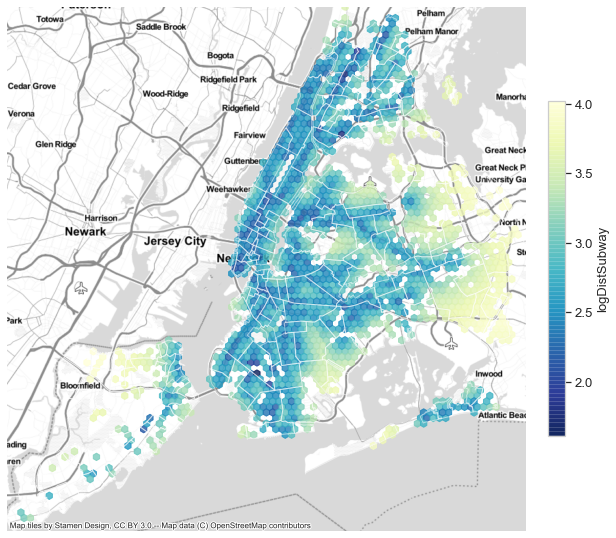

In [95]:
fig, ax = plt.subplots(figsize=(10,10),facecolor="white")

# Plot the log of the Graffiti distance
x = airbnbXY[:,0]
y = airbnbXY[:,1]
hex=plt.hexbin(x, y, C=airbnb_gpd['logDistSubway'].values,cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
plt.colorbar(hex,fraction=0.03,pad=0.04).set_label('logDistSubway',size=13)

# Plot the city limits
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1,alpha=0.5)

# NEW: plot the basemap underneath
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)

xmin, ymin, xmax, ymax = neighbor.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_axis_off()
ax.set_aspect("equal")
plt.savefig('./diagram/detail/subway',bbox_inches='tight')

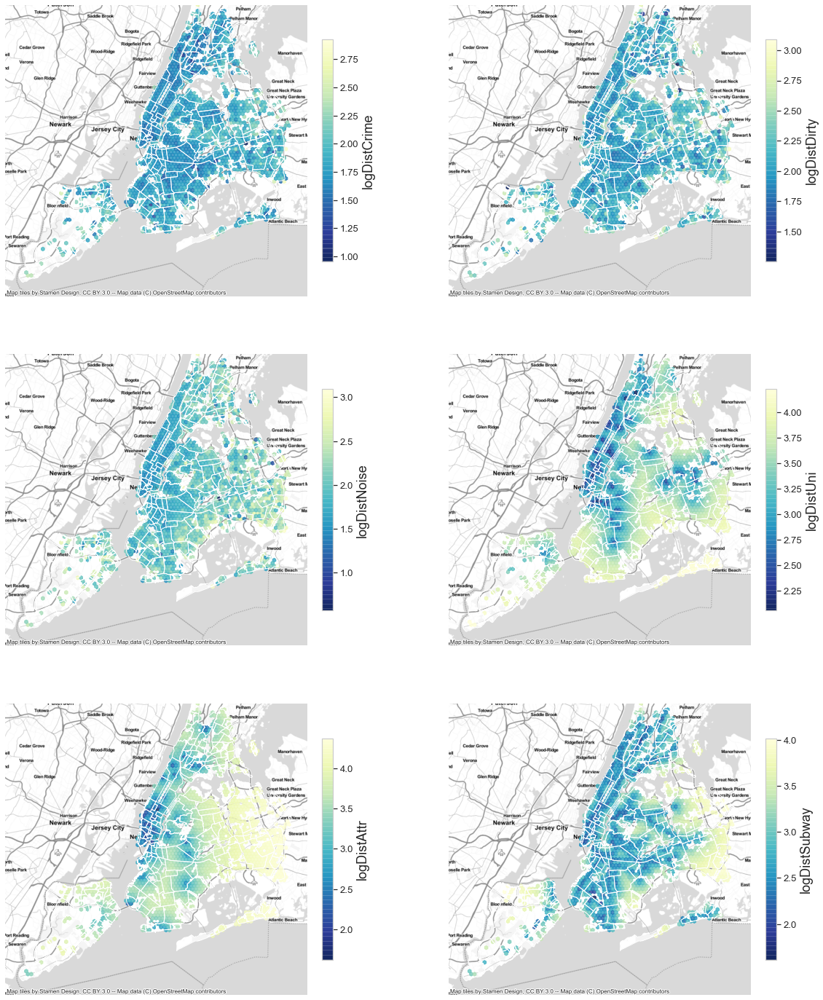

In [96]:
# Plot all features in the same figure
fig, axs = plt.subplots(ncols=2,nrows=3, figsize=(20,25))

# logDistCrime
ax=axs[0][0]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistCrime'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistCrime',size=18)
ax.set_axis_off()

# logDistDirty
ax=axs[0][1]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistDirty'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistDirty',size=18)
ax.set_axis_off()

# logDistNoise
ax=axs[1][0]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistNoise'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistNoise',size=18)
ax.set_axis_off()

# logDistUni
ax=axs[1][1]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistUni'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistUni',size=18)
ax.set_axis_off()

# logDistAttr
ax=axs[2][0]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistAttr'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistAttr',size=18)
ax.set_axis_off()

# logDistSubway
ax=axs[2][1]
hb=ax.hexbin(airbnbXY[:,0], airbnbXY[:,1], C=airbnb_gpd['logDistSubway'].values,
             cmap=plt.cm.YlGnBu_r,gridsize=80,alpha=0.8)
neighbor.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=1)
ctx.add_basemap(ax=ax, crs=airbnb_gpd.crs, url=ctx.providers.Stamen.TonerLite)
plt.colorbar(hb,ax=ax,fraction=0.03,pad=0.04).set_label('logDistSubway',size=18)
ax.set_axis_off()

plt.savefig('./diagram/features',bbox_inches='tight')

###### Add the lagprice variable 

In [97]:
# Add the lagged sales variable
nbrs = NearestNeighbors(n_neighbors=5)
nbrs.fit(airbnbXY)
priceDists, priceIndices = nbrs.kneighbors(airbnbXY)

# the sales for the stations from original data frame
price = airbnb_gpd['price'].values

# get the trips for the 5 nearest neighbors (ignoring first match)
neighboring_price =  price[priceIndices[:,1:]]

# add to features
airbnb_gpd['LaggedPrice'] = neighboring_price.mean(axis=1)

airbnb_gpd.head()

,id,name,description,host_id,host_since,host_response_rate,host_identity_verified,host_response_time,instant_bookable,neighbourhood_group,neighbourhood,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,minimum_nights,availability_30,number_of_reviews,review_scores_rating,last_review,reviews_per_month,cancellation_policy,host_year,price_per_person,count,yield,yield_type,coor,logDistCrime,logDistDirty,logDistNoise,logDistUni,logDistAttr,logDistSubway,LaggedPrice
23052,19520573,"Luxury House in Safe Area, 30 Min to Time Square","OUR PLACE IS GOOD FOR COUPLES, SOLO ADVENTURER...",117673528,2017-02-22,100.0,t,within an hour,t,Queens,Forest Hills,40.71249,-73.85021,Private room,3,2.0,2.0,2.0,900,3,1,10,142,98.0,2019-09-02,5.48,moderate,2017,300.000000,1,63129.600,high,POINT (-8220967.77217632 4970026.052125105),2.060782,2.222232,2.049483,3.118921,3.904160,3.174705,66.25
40240,33467371,"Private, Beautiful Upper Eastside Townhome","Welcome to The Yews. A private, quiet, over-si...",683230,2011-06-09,100.0,t,within a few hours,t,Manhattan,Upper East Side,40.76725,-73.95864,Private room,16,4.5,6.0,9.0,950,8,3,2,21,100.0,2019-09-09,4.34,moderate,2011,59.375000,1,52774.400,high,POINT (-8233038.144563035 4978071.47079969),1.823720,1.876374,0.977596,2.396151,3.073523,2.363442,145.75
41213,34156010,Amazing Luxury Apt in the middle of Manhattan,I do not provide luggage storage as its Manhat...,257677041,2019-04-23,100.0,f,within an hour,t,Manhattan,Kips Bay,40.74210,-73.97404,Entire home/apt,9,2.0,3.0,4.0,539,1,1,4,30,95.0,2019-09-05,7.50,strict_14_with_grace_period,2019,59.888889,1,51744.000,high,POINT (-8234752.46472125 4974375.573860295),1.862929,2.446754,1.832042,3.032535,2.973833,3.030360,278.50
42753,35154411,Affordable Suite Steps from Central Park,The Manhattan Club is the perfect combination ...,231281049,2018-12-18,100.0,f,within an hour,t,Manhattan,Midtown,40.76593,-73.98087,Hotel room,3,1.0,1.0,2.0,399,2,1,26,29,92.0,2019-09-07,9.78,moderate,2018,133.000000,1,49948.416,high,POINT (-8235512.776843368 4977877.456547405),0.936126,2.133499,0.783409,2.935673,2.551740,2.078842,247.00
39323,32668712,BB+B Brooklyn Brick & Brownstone/ Treetop ter...,Welcome to Bed-Stuy! Your group will love sta...,521964,2011-04-19,100.0,t,within an hour,f,Brooklyn,Bedford-Stuyvesant,40.68472,-73.94180,Entire home/apt,10,2.0,5.0,5.0,650,4,1,8,36,100.0,2019-09-09,5.74,strict_14_with_grace_period,2011,65.000000,1,47756.800,high,POINT (-8231163.524338076 4965948.572119144),1.797041,1.754282,1.852523,2.913817,3.426471,2.856677,177.25


### 4.3 Correlation Analysis

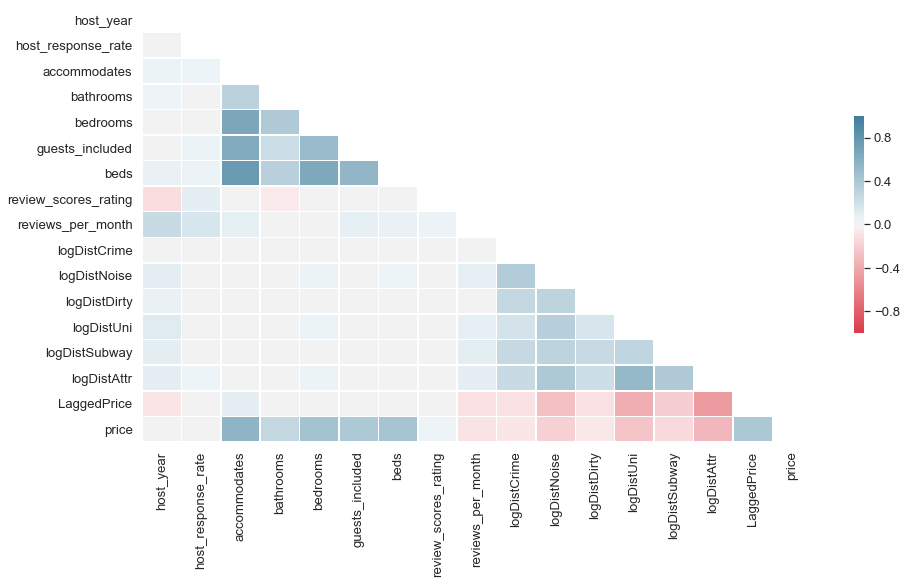

In [98]:
import seaborn as sns

feature_cols = [
     'host_year',
     'host_response_rate',
     'accommodates',
     'bathrooms',
     'bedrooms',
     'guests_included',
     'beds',
     'review_scores_rating',
     'reviews_per_month',
     'logDistCrime',
     'logDistNoise',
     'logDistDirty',
     'logDistUni',
     'logDistSubway',
     'logDistAttr',
     'LaggedPrice',
     'price'
     ]

# Initialize the figure and axes
fx,ax=plt.subplots(figsize=(15,8))

# Compute the correlation matrix
corr=airbnb_gpd[feature_cols].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Generate a custom diverging colormap
cmap = sns.diverging_palette(10,230,as_cmap=True)

heatmap=sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-1, vmax=1, linewidths=.5, cbar_kws={"shrink": .5});
figure = heatmap.get_figure() 
figure.savefig("./diagram/corr.png",bbox_inches='tight')

### 4.4 Model Building

In [99]:
cols_price=[
     #'host_year',
     #'host_response_rate',
     'host_identity_verified',
     'instant_bookable',
     'neighbourhood',
     'room_type',
     'accommodates',
     'bathrooms',
     'bedrooms',
     'guests_included',
     'beds',
     'review_scores_rating',
     'reviews_per_month',
     'cancellation_policy',
     'logDistCrime',
     'logDistNoise',
     'logDistDirty',
     'logDistSubway',
     'logDistAttr',
     'logDistUni',
     'LaggedPrice',
     'price',
     'coor']

price=airbnb_gpd[cols_price].dropna()
len(price)

26624

In [101]:
# Use a 70/30% training/test split
from sklearn.model_selection import train_test_split
import numpy as np

train_set, test_set = train_test_split(price, test_size=0.3, random_state=42)

# the target labels
y_train = np.log(train_set["price"])
y_test = np.log(test_set["price"])

In [102]:
# Set up a pipeline that includes both numerical columns and categorical columns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor


# Numerical columns
num_cols = [
     'accommodates',
     'bathrooms',
     'bedrooms',
     'guests_included',
     'beds',
     'review_scores_rating',
     'reviews_per_month',
     'logDistCrime',
     'logDistNoise',
     'logDistDirty',
     'logDistSubway',
     'logDistAttr',
     'logDistUni',
     'LaggedPrice'
]
# Categorical columns
cat_cols = [ 'host_identity_verified',
             'instant_bookable',
             'neighbourhood',
             'room_type',
             'cancellation_policy'
           ]

# Set up the column transformer with two transformers
# Scale the numerical columns and one-hot 
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
    ]
)

#Initialize the pipeline
regressor = make_pipeline(
    preprocessor, RandomForestRegressor(n_estimators=10, random_state=42)
)

In [103]:
# Evaluate the score on the test set using the best_params_ 
regressor = make_pipeline(preprocessor, RandomForestRegressor(n_estimators=100,max_depth=13,random_state=42))

# Fit the training set
regressor.fit(train_set, y_train);

#  the test score
print(f"Testing Score = {regressor.score(test_set, y_test)}")

Testing Score = 0.7291985385199888


In [104]:
import hvplot.pandas

def plot_feature_importances(regr, num_cols, preprocessor, top=20, **kwargs):
    """
    Utility function to plot the feature importances from the input
    random forest regressor
    """
    # The one-hot step
    ohe = preprocessor.named_transformers_["cat"]

    # One column for each category type!
    ohe_cols = ohe.get_feature_names()

    # Full list of columns is numerical + one-hot
    features = num_cols + list(ohe_cols)

    # The regressor
    regressor = regr["randomforestregressor"]

    # Create the dataframe with importances
    importance = pd.DataFrame(
        {"Feature": features, "Importance": regressor.feature_importances_}
    )

    # Sort importance in descending order and get the top
    importance = importance.sort_values("Importance", ascending=False).iloc[:top]

    # Plot
    return importance.hvplot.barh(x="Feature", y="Importance",line_color="white",color="#71c9ce", flip_yaxis=True, **kwargs)

In [105]:
imp=plot_feature_importances(regressor, num_cols, preprocessor, top=30, height=500)
hvplot.save(imp, './diagram/importance_bar.html')
imp

:Bars   [Feature]   (Importance)

In [107]:
# Predictions for log of total trip counts
log_predictions = regressor.predict(test_set)

# Convert the predicted test values from log
test_set['prediction'] = np.exp(log_predictions)
test_set['percent_error']=(test_set['prediction']-test_set['price'])/test_set['prediction']
test_set['abs_percent_error']=abs(test_set['percent_error'])
test_set.head()

C:\Users\HP\Anaconda3\envs\musa-620\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\HP\Anaconda3\envs\musa-620\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\HP\Anaconda3\envs\musa-620\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

,host_identity_verified,instant_bookable,neighbourhood,room_type,accommodates,bathrooms,bedrooms,guests_included,beds,review_scores_rating,reviews_per_month,cancellation_policy,logDistCrime,logDistNoise,logDistDirty,logDistSubway,logDistAttr,logDistUni,LaggedPrice,price,coor,prediction,percent_error,abs_percent_error
28418,f,f,Williamsburg,Entire home/apt,2,1.0,0.0,1,1.0,96.0,1.63,strict_14_with_grace_period,1.761360,1.796961,1.822849,2.917375,3.058330,2.988543,154.50,104,POINT (-8233615.892720251 4969926.187152114),139.204941,0.252900,0.252900
8292,f,t,East Harlem,Private room,1,1.0,1.0,1,1.0,94.0,1.33,strict_14_with_grace_period,1.911669,1.630946,2.186947,2.689316,3.406302,3.246931,91.50,40,POINT (-8231346.088302976 4981608.497046458),61.104457,0.345383,0.345383
29057,f,f,West Village,Entire home/apt,4,1.5,2.0,1,2.0,98.0,3.10,strict_14_with_grace_period,1.693627,1.930580,2.089809,2.440697,2.762252,2.863044,272.75,200,POINT (-8237959.579251005 4972427.52444041),275.787728,0.274805,0.274805
10194,t,f,Lower East Side,Private room,4,1.0,1.0,2,2.0,94.0,2.42,moderate,1.659224,1.773969,1.894693,2.667160,2.195159,3.090827,209.00,115,POINT (-8236015.940941754 4971267.106368262),123.500845,0.068832,0.068832
8707,t,f,Astoria,Private room,2,1.0,1.0,1,1.0,99.0,2.13,strict_14_with_grace_period,1.532121,2.208124,2.191212,3.007891,3.644900,3.499192,82.00,59,POINT (-8227719.299292931 4977862.758655019),71.330289,0.172862,0.172862


In [108]:
# calculate the airbnb count by neighborhood
abs_nei=test_set.groupby(["neighbourhood"])["abs_percent_error"].mean()
abs_nei=pd.DataFrame(abs_nei).reset_index()

abs_nei=neighbor.merge(abs_nei,on="neighbourhood")
abs_nei.head()

,neighbourhood,neighbourhood_group,geometry,abs_percent_error
0,Bayswater,Queens,(POLYGON ((-8211672.372056099 4955705.98588607...,0.135896
1,Bayswater,Queens,(POLYGON ((-8211489.474132727 4955509.04187944...,0.135896
2,Allerton,Bronx,(POLYGON ((-8220788.21383767 4993431.405621486...,0.420414
3,City Island,Bronx,(POLYGON ((-8213466.174330741 4989346.93912581...,0.221966
4,City Island,Bronx,(POLYGON ((-8213660.983439631 4991671.62690924...,0.221966


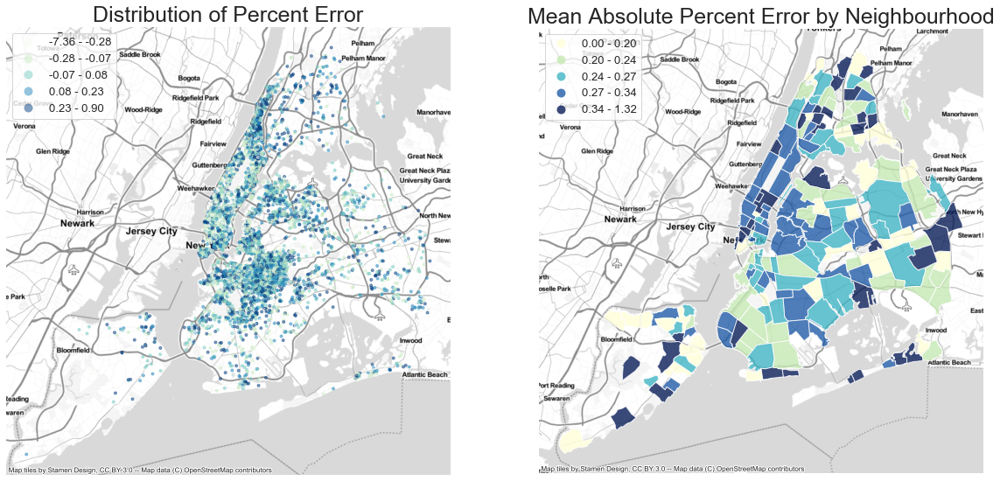

In [109]:
# Plot two columns
fig, axs = plt.subplots(ncols=2, figsize=(20,10))

# Predicted values
test_set.plot(ax=axs[0], column='percent_error', marker='.',cmap="GnBu",alpha=0.5,
            legend=True,legend_kwds=dict(loc='upper left'),scheme="Quantiles",k=5)
ctx.add_basemap(ax=axs[0], crs=test_set.crs, url=ctx.providers.Stamen.TonerLite)
axs[0].set_title("Distribution of Percent Error",size=25)

# Actual values
abs_nei.plot(ax=axs[1],column="abs_percent_error",edgecolor="white",alpha=0.8,
              legend=True,legend_kwds=dict(loc='upper left'),cmap="YlGnBu",scheme="Quantiles",k=5)
ctx.add_basemap(ax=axs[1], crs=test_set.crs, url=ctx.providers.Stamen.TonerLite)
axs[1].set_title("Mean Absolute Percent Error by Neighbourhood",size=25)

axs[0].set_axis_off()
axs[1].set_axis_off()
plt.savefig('./diagram/model_validation.png',bbox_inches='tight')